# 1-Import Data

In [3]:
import fileselector as fs
from importlib import reload
reload(fs)
fs.load_dependencies()
# Usage
# Replace '/your/start/directory/' with your actual start directory
Path='/home/coder/project/doric_fiberphotometry/Data/knob'

file_selector = fs.FileSelector(Path,False)
# file_name = file_selector.get_selected_file()


Dropdown(description='Select File:', options=('Select a file', '258_MCx_Knob_Nov17_HP_0000.doric', '258_NAc_kn…

Selected file: /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete.doric
loading dataset .....


GridBox(children=(Dropdown(description='Isos:', index=7, layout=Layout(height='100px', width='100%'), options=…

Button(description='Load Data', layout=Layout(display='none'), style=ButtonStyle())

Not all datasets were automatically selected, please review and select manually.
Datasets loaded.


In [9]:
## After selecting datasets, the respective info will be displayed.
## Then, click "Load Data" button to load the datasets.
isos_df = file_selector.get_isos_df()
grabda_df = file_selector.get_grabda_df()
event_df = file_selector.get_event_df()


# Knob Events


In [13]:
import dataexplorer as de
from importlib import reload
import ipywidgets as widgets
from IPython.display import display
reload(de)

rising_edges = event_df['Data'].diff() == 1
rising_edge_df = event_df[rising_edges].reset_index().rename(columns={'index': 'Sample_Number'})
## Calculate the optimal time window
optimal_window = de.find_optimal_time_window(rising_edge_df,Event_type='Knob')
print("optimal window is :",optimal_window)
## Classify events in the rising_edge_df
# classified_events_df = de.classify_events(rising_edge_df,optimal_window,['Init','Success','Fail'])
classified_events_df = de.classify_events(rising_edge_df,optimal_window,Event_type='knob')

print(classified_events_df.head())
print("Event Number: ",len(classified_events_df))


optimal window is : 0.034
      Time     Type  Sample_Number
0  22.8200     Init       228200.0
1  23.3277  Success       233277.0
2  32.5229     Init       325229.0
3  32.6787  Success       326787.0
4  43.7436     Init       437436.0
Event Number:  81


# Data Prepration


## ThomasAkam
integration ThomasAkam [repo]("https://github.com/ThomasAkam/photometry_preprocessing") with Doric Files

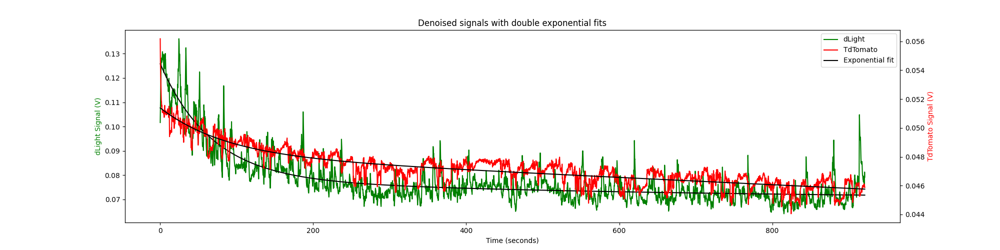

In [12]:
import photometry_functions as pf
import numpy as np
import pandas as pd


import os
import numpy as  np
import pylab as plt
from scipy.signal import medfilt, butter, filtfilt
from scipy.stats import linregress
from scipy.optimize import curve_fit, minimize



time_seconds = isos_df.Time
TdTom_denoised = isos_df.Data
dLight_denoised = grabda_df.Data

time_diff = np.diff(isos_df.Time)
fs = 1 / np.mean(time_diff)  # Calculate sampling rate from the time intervals

TdTom_denoised = pf.sharp_low_pass_filter(isos_df.Data, cutoff=10, fs=fs, order=4)
dLight_denoised = pf.sharp_low_pass_filter(grabda_df.Data, cutoff=10, fs=fs, order=4)

# The double exponential curve we are going to fit.
def double_exponential(t, const, amp_fast, amp_slow, tau_slow, tau_multiplier):
    '''Compute a double exponential function with constant offset.
    Parameters:
    t       : Time vector in seconds.
    const   : Amplitude of the constant offset. 
    amp_fast: Amplitude of the fast component.  
    amp_slow: Amplitude of the slow component.  
    tau_slow: Time constant of slow component in seconds.
    tau_multiplier: Time constant of fast component relative to slow. 
    '''
    tau_fast = tau_slow*tau_multiplier
    return const+amp_slow*np.exp(-t/tau_slow)+amp_fast*np.exp(-t/tau_fast)

# Fit curve to dLight signal.
max_sig = np.max(dLight_denoised)
inital_params = [max_sig/2, max_sig/4, max_sig/4, 3600, 0.1]
bounds = ([0      , 0      , 0      , 600  , 0],
          [max_sig, max_sig, max_sig, 36000, 1])
dLight_parms, parm_cov = curve_fit(double_exponential, time_seconds, dLight_denoised, 
                                  p0=inital_params, bounds=bounds, maxfev=1000)
dLight_expfit = double_exponential(time_seconds, *dLight_parms)

# Fit curve to TdTomato signal.
max_sig = np.max(TdTom_denoised)
inital_params = [max_sig/2, max_sig/4, max_sig/4, 3600, 0.1]
bounds = ([0      , 0      , 0      , 600  , 0],
          [max_sig, max_sig, max_sig, 36000, 1])
TdTom_parms, parm_cov = curve_fit(double_exponential, time_seconds, TdTom_denoised, 
                                  p0=inital_params, bounds=bounds, maxfev=1000)
TdTom_expfit = double_exponential(time_seconds, *TdTom_parms)

#plot fits over denoised data
fig,ax1=plt.subplots(1,1, figsize=(20, 5))  
plot1=ax1.plot(time_seconds, dLight_denoised, 'g', label='dLight')
plot3=ax1.plot(time_seconds, dLight_expfit, color='k', linewidth=1.5, label='Exponential fit') 
ax2=plt.twinx()
plot2=ax2.plot(time_seconds, TdTom_denoised, color='r', label='TdTomato') 
plot4=ax2.plot(time_seconds, TdTom_expfit,color='k', linewidth=1.5) 


ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('dLight Signal (V)', color='g')
ax2.set_ylabel('TdTomato Signal (V)', color='r')
ax1.set_title('Denoised signals with double exponential fits')

lines = plot1 + plot2 + plot3
labels = [l.get_label() for l in lines]  
legend = ax1.legend(lines, labels, loc='upper right'); 
# ax1.set_ylim(1.27, 1.62)
# ax2.set_ylim(1.35, 1.7);

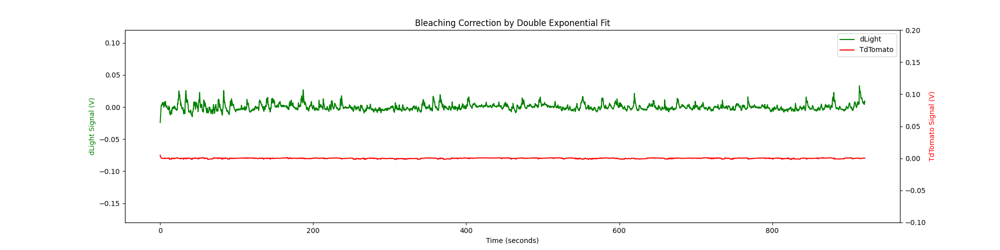

In [15]:
dLight_detrended = dLight_denoised - dLight_expfit
TdTom_detrended = TdTom_denoised - TdTom_expfit

fig,ax1=plt.subplots(1,1, figsize=(20, 5))  
plot1=ax1.plot(time_seconds, dLight_detrended, 'g', label='dLight')
ax2=plt.twinx()
plot2=ax2.plot(time_seconds, TdTom_detrended, color='r', label='TdTomato') 

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('dLight Signal (V)', color='g')
ax2.set_ylabel('TdTomato Signal (V)', color='r')
ax1.set_title('Bleaching Correction by Double Exponential Fit')

lines = plot1+plot2 
labels = [l.get_label() for l in lines]  
legend = ax1.legend(lines, labels, loc='upper right'); 
ax1.set_ylim(-0.18, 0.12)
ax2.set_ylim(-0.1, 0.2);

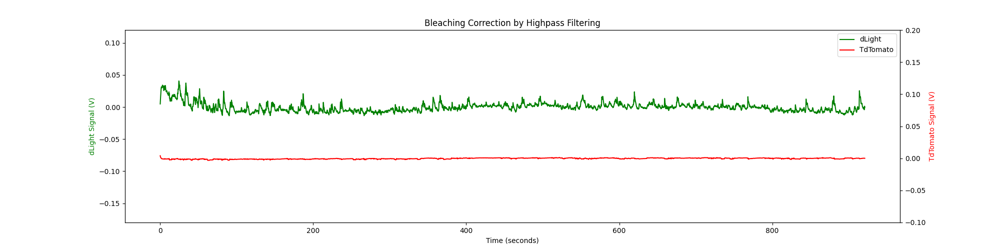

In [16]:
sampling_rate=fs
b,a = butter(2, 0.001, btype='high', fs=sampling_rate)
dLight_highpass = filtfilt(b,a, dLight_denoised, padtype='even')
TdTom_highpass = filtfilt(b,a, TdTom_denoised, padtype='even')


fig,ax1=plt.subplots(1,1, figsize=(20, 5))  
plot1=ax1.plot(time_seconds, dLight_highpass, 'g', label='dLight')
ax2=plt.twinx()
plot2=ax2.plot(time_seconds, TdTom_highpass, color='r', label='TdTomato') 

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('dLight Signal (V)', color='g')
ax2.set_ylabel('TdTomato Signal (V)', color='r')
ax1.set_title('Bleaching Correction by Highpass Filtering')

lines = plot1+plot2 
labels = [l.get_label() for l in lines]  
legend = ax1.legend(lines, labels, loc='upper right'); 
ax1.set_ylim(-0.18, 0.12)
ax2.set_ylim(-0.1, 0.2);


Slope    : 1.069
R-squared: 0.014


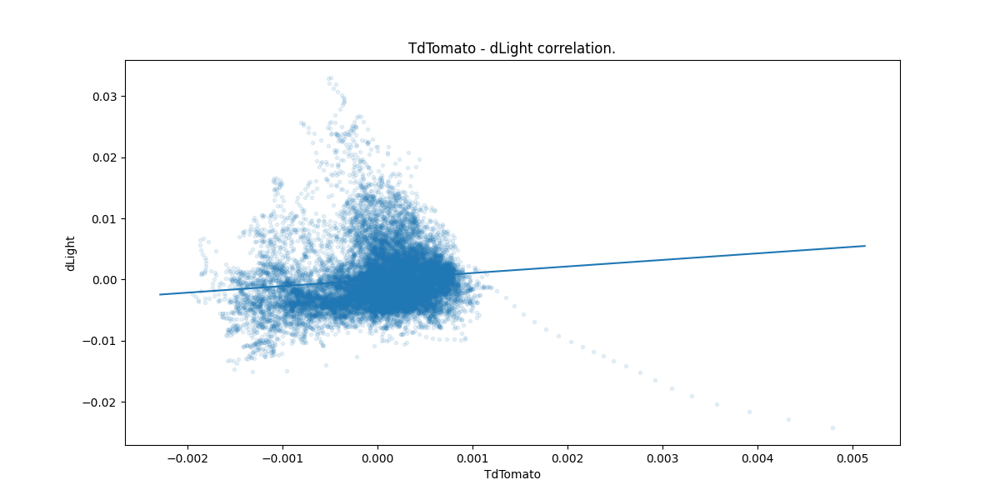

In [22]:
slope, intercept, r_value, p_value, std_err = linregress(x=TdTom_detrended, y=dLight_detrended)
plt.figure(figsize=(12, 6))
plt.scatter(TdTom_detrended[::5], dLight_detrended[::5],alpha=0.1, marker='.')
x = np.array(plt.xlim())
plt.plot(x, intercept+slope*x)
plt.xlabel('TdTomato')
plt.ylabel('dLight')
plt.title('TdTomato - dLight correlation.')

print('Slope    : {:.3f}'.format(slope))
print('R-squared: {:.3f}'.format(r_value**2))

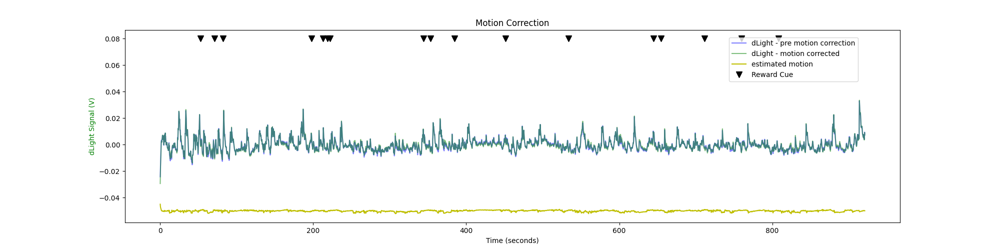

In [24]:
reward_cue_times = classified_events_df.Time[classified_events_df.Type == 'Fail']
dLight_est_motion = intercept + slope * TdTom_detrended
dLight_corrected = dLight_detrended - dLight_est_motion

fig,ax1=plt.subplots(1,1, figsize=(20, 5))  
plot1=ax1.plot(time_seconds, dLight_detrended, 'b' , label='dLight - pre motion correction', alpha=0.5)
plot3=ax1.plot(time_seconds, dLight_corrected, 'g', label='dLight - motion corrected', alpha=0.5)
plot4=ax1.plot(time_seconds, dLight_est_motion - 0.05, 'y', label='estimated motion')
reward_ticks = ax1.plot(reward_cue_times, np.full(np.size(reward_cue_times), 0.08), label='Reward Cue',color='w', marker="v", mfc='k', mec='k', ms=8)

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('dLight Signal (V)', color='g')
ax1.set_title('Motion Correction')

lines = plot1+plot3+plot4+ reward_ticks
labels = [l.get_label() for l in lines]  
legend = ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))

# ax1.set_xlim(1000, 1060)  # 60 sec window
# ax1.set_ylim(-0.075, 0.1);

## reminder
only run one of the following sections the out put will create the `signal_df` for PSTH analysis 

### Method 1: dF/F


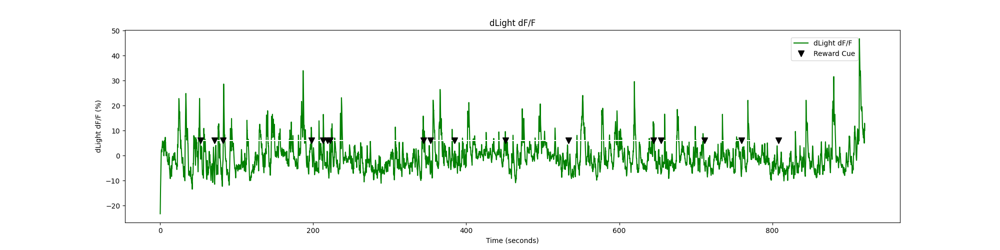

In [26]:

import pandas as pd 

dLight_dF_F = 100*dLight_corrected/dLight_expfit
signal_df = pd.DataFrame({'Time': isos_df.Time, 'Data': dLight_dF_F})
fig,ax1=plt.subplots(1,1, figsize=(20, 5))  
plot1=ax1.plot(time_seconds, dLight_dF_F, 'g', label='dLight dF/F')
reward_ticks = ax1.plot(reward_cue_times, np.full(np.size(reward_cue_times), 6), label='Reward Cue',color='w', marker="v", mfc='k', mec='k', ms=8)

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('dLight dF/F (%)')
ax1.set_title('dLight dF/F')

lines = plot1+ reward_ticks
labels = [l.get_label() for l in lines]  
legend = ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))

# ax1.set_xlim(1000, 1060)
# ax1.set_ylim(-3, 7);

### Method 2: Z-scoring

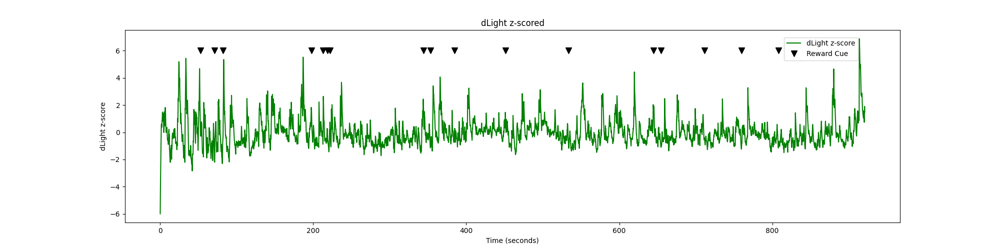

In [31]:
import pandas as pd
dLight_zscored = (dLight_corrected-np.mean(dLight_corrected))/np.std(dLight_corrected)
signal_df = pd.DataFrame({'Time': isos_df.Time, 'Data': dLight_zscored})

fig,ax1=plt.subplots(1,1, figsize=(20, 5))  
plot1=ax1.plot(time_seconds, dLight_zscored, 'g', label='dLight z-score')
reward_ticks = ax1.plot(reward_cue_times, np.full(np.size(reward_cue_times), 6), label='Reward Cue',color='w', marker="v", mfc='k', mec='k', ms=8)

ax1.set_xlabel('Time (seconds)')
ax1.set_ylabel('dLight z-score')
ax1.set_title('dLight z-scored')

lines = plot1+ reward_ticks
labels = [l.get_label() for l in lines]  
legend = ax1.legend(lines, labels, loc='upper right', bbox_to_anchor=(0.95, 0.98))

# ax1.set_xlim(1000, 1060)
# ax1.set_ylim(-3, 7);

# PSTH Prepration

## Cut and Center the Data

In [32]:
import photometry_functions as pf
from importlib import reload

reload(pf)

# Example usage:
time_window = (-5, 10)  # For example, 2 seconds before and after the event
event_type = "Init"  # Use "All" to process all events, or specify a particular type like 'Init'
centralized_signals_df_Init = pf.cut_and_center_signals_modified(signal_df, classified_events_df, time_window, event_type)
print(centralized_signals_df_Init.head())

event_type = "Success"  # Use "All" to process all events, or specify a particular type like 'Init'
centralized_signals_df_Success = pf.cut_and_center_signals_modified(signal_df, classified_events_df, time_window, event_type)
print(centralized_signals_df_Success.head())

event_type = "Fail"  # Use "All" to process all events, or specify a particular type like 'Init'
centralized_signals_df_Fail = pf.cut_and_center_signals_modified(signal_df, classified_events_df, time_window, event_type)
print(centralized_signals_df_Fail.head())


            Time      Data
Event Row                 
1     1772 -5.00  0.059494
      1773 -4.99  0.081245
      1774 -4.98  0.102180
      1775 -4.97  0.121996
      1776 -4.96  0.140380
            Time      Data
Event Row                 
1     1772 -5.00  0.059494
      1773 -4.99  0.081245
      1774 -4.98  0.102180
      1775 -4.97  0.121996
      1776 -4.96  0.140380
            Time      Data
Event Row                 
1     4529 -5.00  0.795732
      4530 -4.99  0.772211
      4531 -4.98  0.747395
      4532 -4.97  0.721396
      4533 -4.96  0.694347


In [33]:
import pandas as pd


def shift_signals_vectorized(df):
    # Identify the Data value at Time = 0 for each event
    time_zero_values = df[df['Time'] == 0].groupby('Event')['Data'].first()

    # Map the shift values back to the original DataFrame
    df['Shift'] = df.index.get_level_values('Event').map(time_zero_values)

    # Subtract the shift value from the Data column
    df['Data'] -= df['Shift']

    # Drop the temporary 'Shift' column
    df = df.drop(columns=['Shift'])

    return df

# Apply the function to shift the signals
shifted_signals_df_Fail = shift_signals_vectorized(centralized_signals_df_Fail)
shifted_signals_df_Success = shift_signals_vectorized(centralized_signals_df_Success)
shifted_signals_df_Init = shift_signals_vectorized(centralized_signals_df_Init)

# Display the shifted DataFrame
print(shifted_signals_df_Fail)


              Time      Data
Event Row                   
1     4529   -5.00 -0.873785
      4530   -4.99 -0.897306
      4531   -4.98 -0.922122
      4532   -4.97 -0.948121
      4533   -4.96 -0.975170
...            ...       ...
17    81610   9.96 -1.560009
      81611   9.97 -1.565763
      81612   9.98 -1.571449
      81613   9.99 -1.577117
      81614  10.00 -1.582811

[25517 rows x 2 columns]


In [15]:
print(centralized_signals_df_Fail)

              Time      Data
Event Row                   
1     4529   -5.00  0.958292
      4530   -4.99  0.935193
      4531   -4.98  0.925473
      4532   -4.97  0.920958
      4533   -4.96  0.909131
...            ...       ...
17    81610   9.96 -0.093527
      81611   9.97 -0.079239
      81612   9.98 -0.068296
      81613   9.99 -0.057138
      81614  10.00 -0.043772

[25517 rows x 2 columns]


## cut signal around Init

In [ ]:
# Example usage:
time_window = (-4, 10)  # For example, 2 seconds before and after the event
event_type = "Init"  # Use "All" to process all events, or specify a particular type like 'Init'
centralized_signals_df_Init = pf.cut_and_center_signals(signal_df, classified_events_df, time_window, event_type)
print(centralized_signals_df_Init.head())

event_type = "Success"  # Use "All" to process all events, or specify a particular type like 'Init'
centralized_signals_df_Success = pf.cut_and_center_signals(signal_df, classified_events_df, time_window, event_type)
print(centralized_signals_df_Success.head())

event_type = "Fail"  # Use "All" to process all events, or specify a particular type like 'Init'
centralized_signals_df_Fail = pf.cut_and_center_signals(signal_df, classified_events_df, time_window, event_type)
print(centralized_signals_df_Fail.head())


## Plot Dataset

### Plot all Signals 

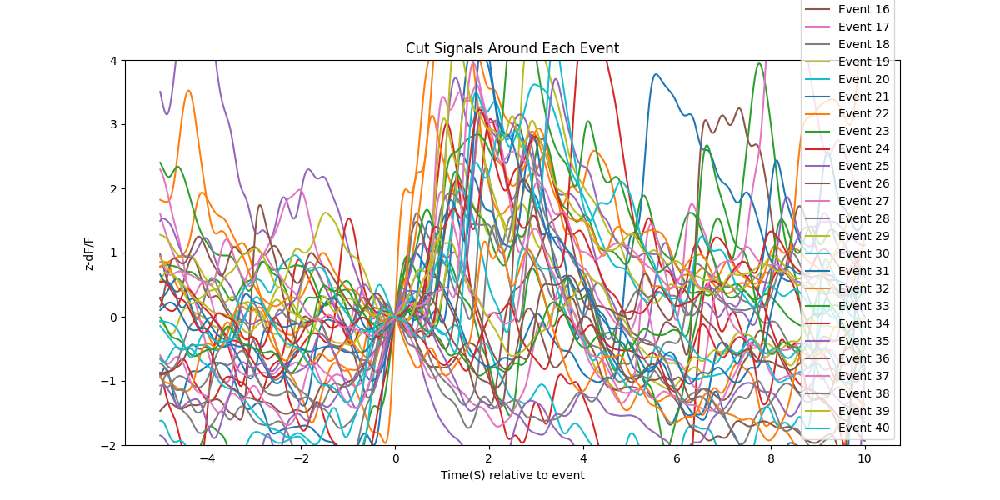

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//all_Inits.png


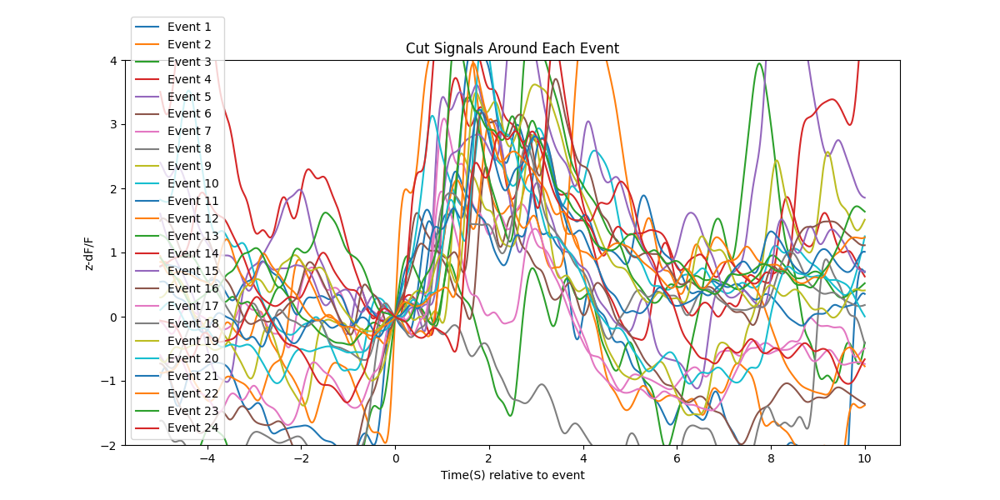

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//all_Success.png


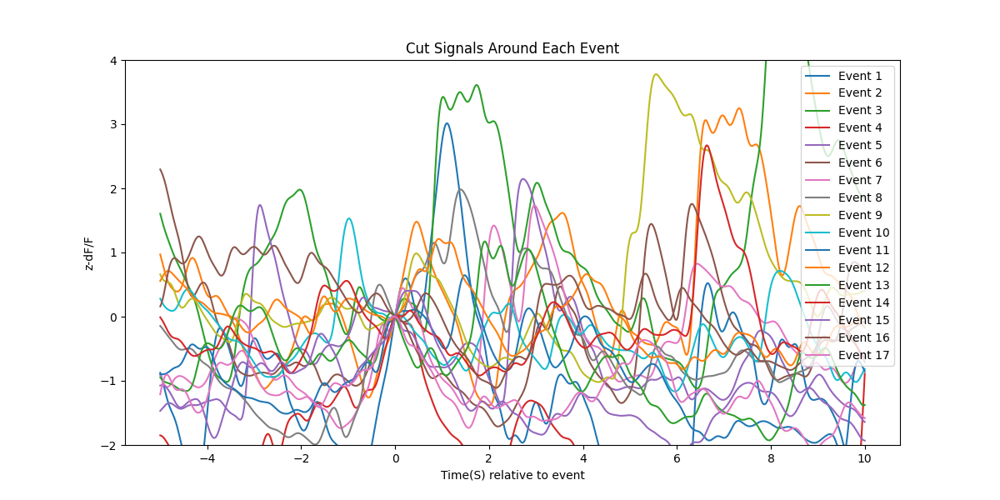

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//all_Fails.png


In [34]:
import os
# Plot All signals
y_min = -2
y_max = 4

import photometry_functions as pf
from importlib import reload
reload(pf)





# Init:
fig = plt
pf.plot_cut_signals(centralized_signals_df_Init,y_min,y_max)
# plot_cut_signals(filtered_signal_df)
filename = file_selector.file_path.split('.')[0]+'/Figs/'+'/all_Inits.png'

directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)

fig.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")

# Success:
fig = plt
pf.plot_cut_signals(centralized_signals_df_Success,y_min,y_max)
# plot_cut_signals(filtered_signal_df)
filename = file_selector.file_path.split('.')[0]+'/Figs/'+'/all_Success.png'

directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)

fig.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")

# Fail:
fig = plt
pf.plot_cut_signals(centralized_signals_df_Fail,y_min,y_max)
# plot_cut_signals(filtered_signal_df)
filename = file_selector.file_path.split('.')[0]+'/Figs/'+'/all_Fails.png'

directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)

fig.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")



### Plot Signals seperatly

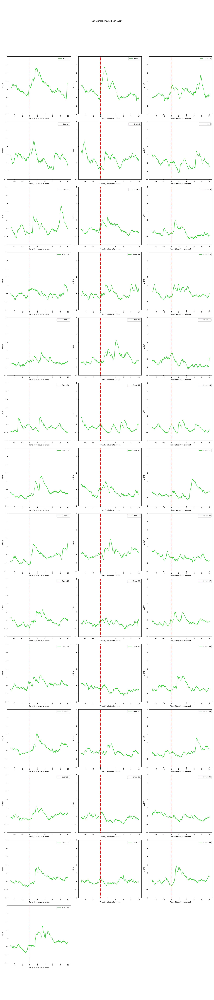

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//Separeted_Init_Events.png


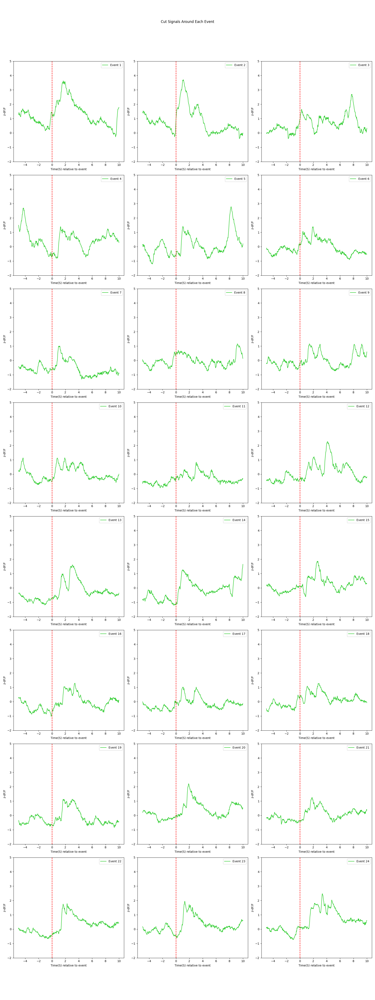

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//Separeted_Success_Events.png


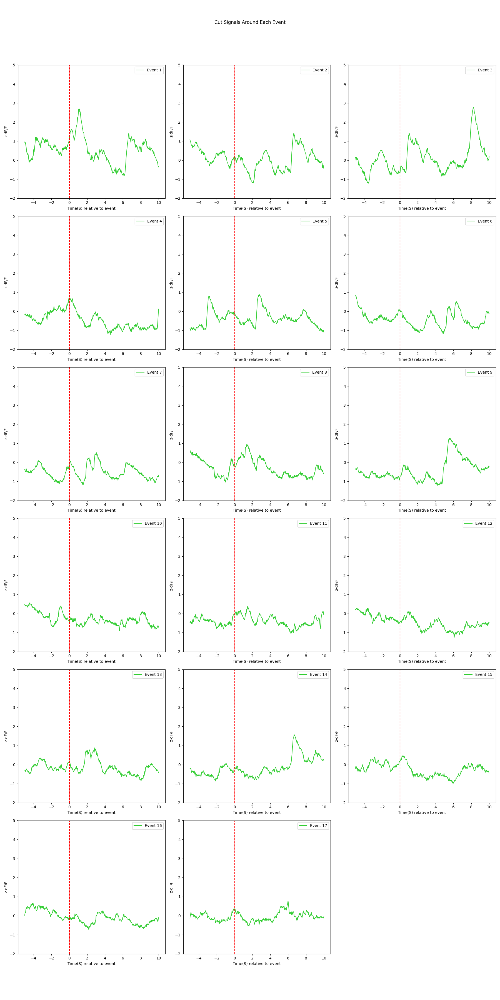

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//Separeted_Fail_Events.png


In [13]:
y_max=5
y_min=-2

import photometry_functions as pf
from importlib import reload

reload(pf)

# Init
pf.plot_cut_signals_seperated(centralized_signals_df_Init,y_min,y_max)

fig = plt
filename = file_selector.file_path.split('.')[0]+'/Figs/'+'/Separeted_Init_Events.png'

directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)

fig.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")

# Success
pf.plot_cut_signals_seperated(centralized_signals_df_Success,y_min,y_max)

fig = plt
filename = file_selector.file_path.split('.')[0]+'/Figs/'+'/Separeted_Success_Events.png'

directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)

fig.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")

# Fail
pf.plot_cut_signals_seperated(centralized_signals_df_Fail,y_min,y_max)

fig = plt
filename = file_selector.file_path.split('.')[0]+'/Figs/'+'/Separeted_Fail_Events.png'

directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)

fig.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")

### Plot and Select Signals for PSTH

In [38]:

import photometry_functions as pf
from importlib import reload
import os

reload(pf)

# Example usage:

def handle_filtered_data(df,event_type):
    # Handle the filtered DataFrame here, e.g., save it to a global variable or process it further
    if event_type == 'Init':    
        global filtered_signal_df_Init
        filtered_signal_df_Init = df
        print(filtered_signal_df_Init.head())
    
    if event_type == 'Fail':    
        global filtered_signal_df_Fail
        filtered_signal_df_Fail = df
        print(filtered_signal_df_Fail.head())
    
    if event_type == 'Success':    
        global filtered_signal_df_Success
        filtered_signal_df_Success = df
        print(filtered_signal_df_Success.head())
    
    
    fig = plt
    filename = file_selector.file_path.split('.')[0]+'/Figs/'+'/Selected_Stim_Events_'+event_type+'.png'

    directory = os.path.dirname(filename)
    if not os.path.exists(directory):
        os.makedirs(directory)

    fig.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Figure saved as {filename}")


centralized_signals_df_Fail
# Init:
# explorer = pf.SignalExplorer(shifted_signals_df_Init,'Init', save_callback=handle_filtered_data)
explorer = pf.SignalExplorer(centralized_signals_df_Init,'Init', save_callback=handle_filtered_data)
# This will display the widgets and allow interaction

# Success:
# explorer = pf.SignalExplorer(shifted_signals_df_Success,'Success', save_callback=handle_filtered_data)
explorer = pf.SignalExplorer(centralized_signals_df_Success,'Success', save_callback=handle_filtered_data)

# This will display the widgets and allow interaction

# Fail:
# explorer = pf.SignalExplorer(shifted_signals_df_Fail,'Fail', save_callback=handle_filtered_data)
explorer = pf.SignalExplorer(centralized_signals_df_Fail,'Fail', save_callback=handle_filtered_data)

# This will display the widgets and allow interaction


GridspecLayout(children=(Checkbox(value=False, description='Select All', layout=Layout(grid_area='widget001'))…

Button(description='Apply Selection', style=ButtonStyle())

Output()

GridspecLayout(children=(Checkbox(value=False, description='Select All', layout=Layout(grid_area='widget001'))…

Button(description='Apply Selection', style=ButtonStyle())

Output()

GridspecLayout(children=(Checkbox(value=False, description='Select All', layout=Layout(grid_area='widget001'))…

Button(description='Apply Selection', style=ButtonStyle())

Output()

Filtered data is ready.
            Time      Data     Shift
Event Row                           
1     4529 -5.00 -0.873785  1.669517
      4530 -4.99 -0.897306  1.669517
      4531 -4.98 -0.922122  1.669517
      4532 -4.97 -0.948121  1.669517
      4533 -4.96 -0.975170  1.669517
Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//Selected_Stim_Events_Fail.png


Filtered data is ready.
            Time      Data     Shift
Event Row                           
1     1772 -5.00 -0.941537  1.001031
      1773 -4.99 -0.919786  1.001031
      1774 -4.98 -0.898851  1.001031
      1775 -4.97 -0.879035  1.001031
      1776 -4.96 -0.860651  1.001031
Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//Selected_Stim_Events_Success.png


Filtered data is ready.
            Time      Data     Shift
Event Row                           
1     1772 -5.00 -0.941537  1.001031
      1773 -4.99 -0.919786  1.001031
      1774 -4.98 -0.898851  1.001031
      1775 -4.97 -0.879035  1.001031
      1776 -4.96 -0.860651  1.001031
Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//Selected_Stim_Events_Init.png


## Normalization

In [39]:
import photometry_functions as pf
from importlib import reload

reload(pf)


# Init:
# Assuming 'Data' is the column in filtered_signal_df that you want to normalize
# normalized_signal_df_Init = pf.normalize_signal(filtered_signal_df_Init, column='Data')
normalized_signal_df_Init = filtered_signal_df_Init

# Success:
# Assuming 'Data' is the column in filtered_signal_df that you want to normalize
# normalized_signal_df_Success = pf.normalize_signal(filtered_signal_df_Success, column='Data')
normalized_signal_df_Success = filtered_signal_df_Success

# Fail:
# Assuming 'Data' is the column in filtered_signal_df that you want to normalize
# normalized_signal_df_Fail = pf.normalize_signal(filtered_signal_df_Fail, column='Data')
normalized_signal_df_Fail = filtered_signal_df_Fail


# Analyze Resaults

## PSTH 

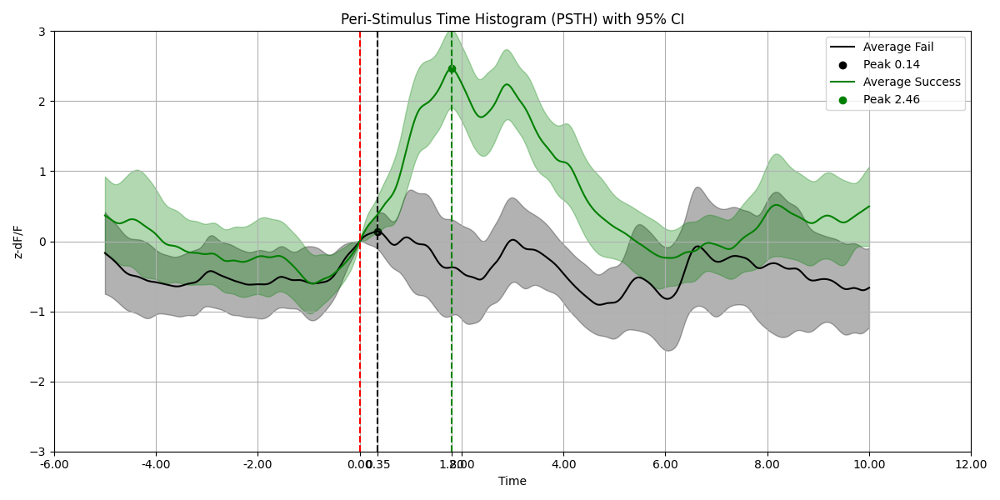

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs/Akam-PSTH.svg


In [64]:
import photometry_functions as pf
import os
from importlib import reload

reload(pf)

PSTH_df_ci_Fail = pf.create_psth_with_ci(normalized_signal_df_Fail)
PSTH_df_ci_Success = pf.create_psth_with_ci(normalized_signal_df_Success)

plt.figure(figsize=(12, 6))

pf.plot_psth_with_CI_cloud (PSTH_df_ci_Fail, -3, 3,'black','Fail')
pf.plot_psth_with_CI_cloud (PSTH_df_ci_Success, -3, 3,'green','Success')

plt.tight_layout()

plt.show()

filename = file_selector.file_path.split('.')[0]+'/Figs/'+'Akam-PSTH.svg'


directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)

fig.savefig(filename, format='svg', dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")


## HeatMap

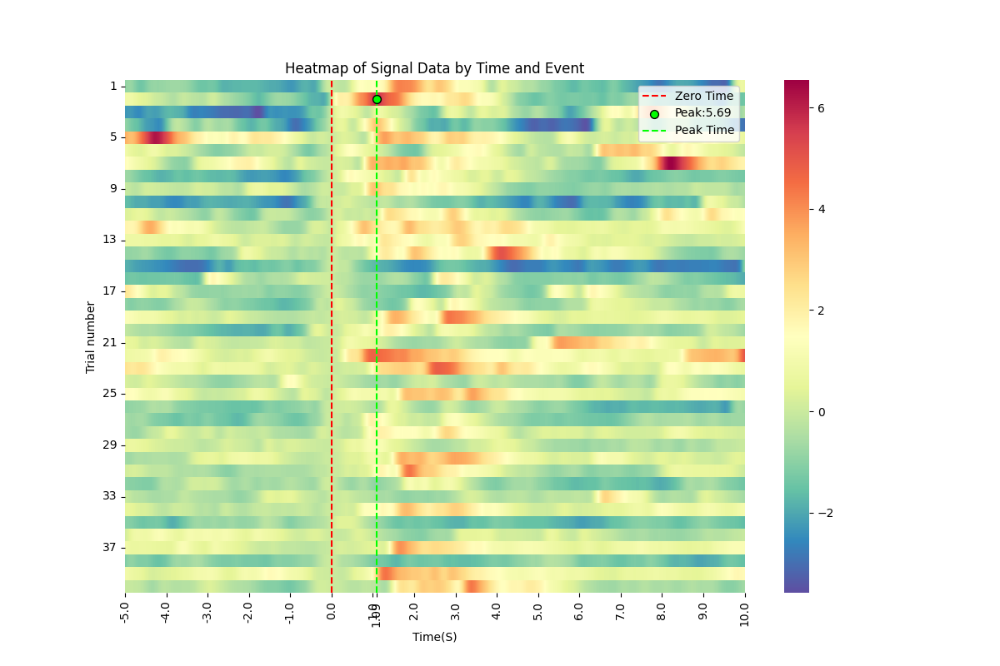

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//Heatmap_init.svg


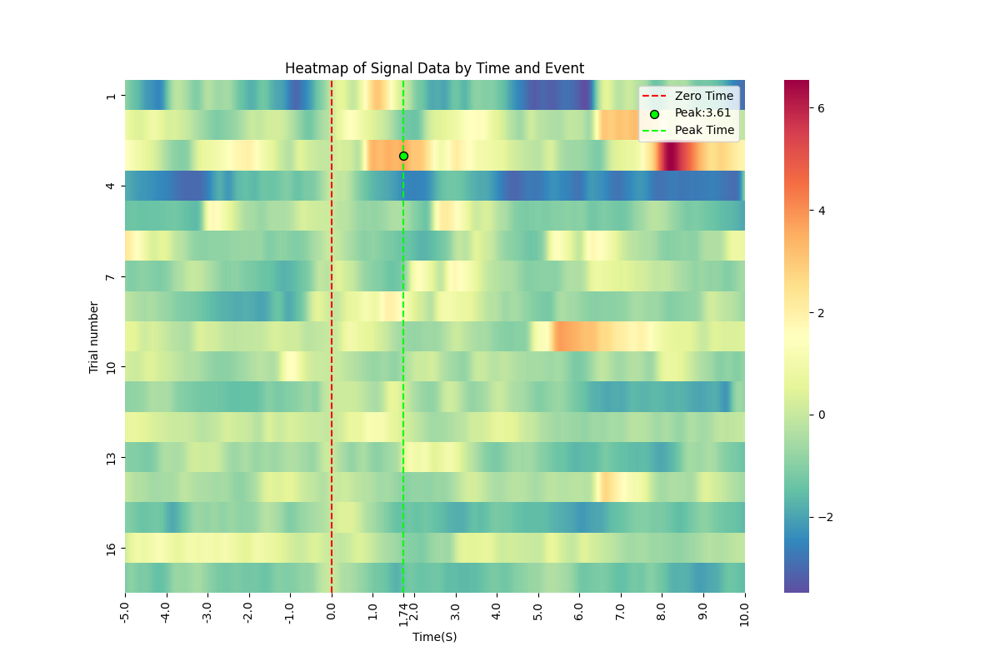

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//Heatmap_Fail.svg


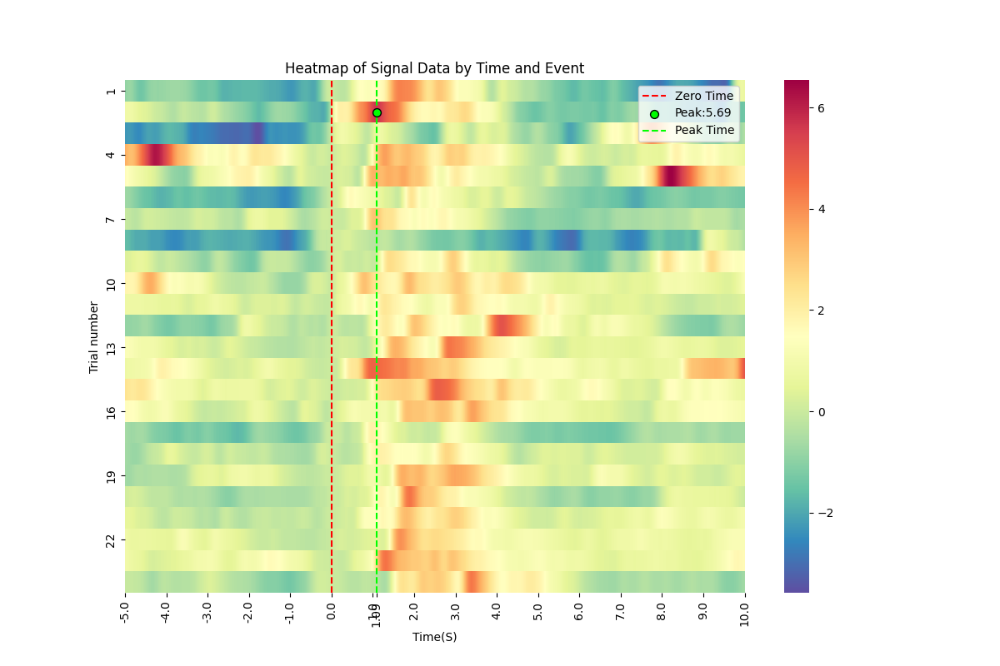

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs//Heatmap_Success.svg


In [65]:
import photometry_functions as pf
import os
from importlib import reload

reload(pf)

filename = file_selector.file_path.split('.')[0]+'/Figs/'+'/Heatmap_init.svg'
directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)


pf.heatmap_plot(normalized_signal_df_Init)
plt.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")

filename = file_selector.file_path.split('.')[0]+'/Figs/'+'/Heatmap_Fail.svg'
pf.heatmap_plot(normalized_signal_df_Fail)
plt.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")

filename = file_selector.file_path.split('.')[0]+'/Figs/'+'/Heatmap_Success.svg'
pf.heatmap_plot(normalized_signal_df_Success)
plt.savefig(filename, format='svg', dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")


### Area Under Curves 

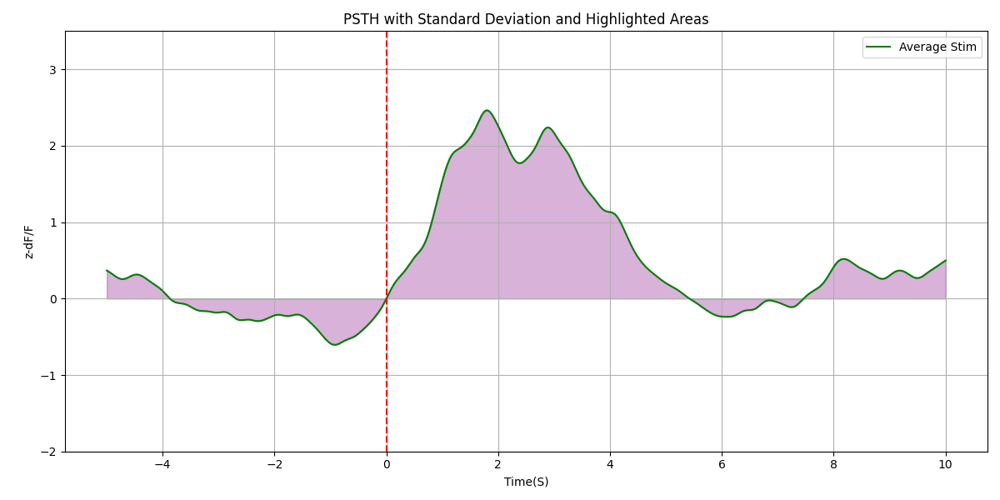

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs/AUC_Success.png


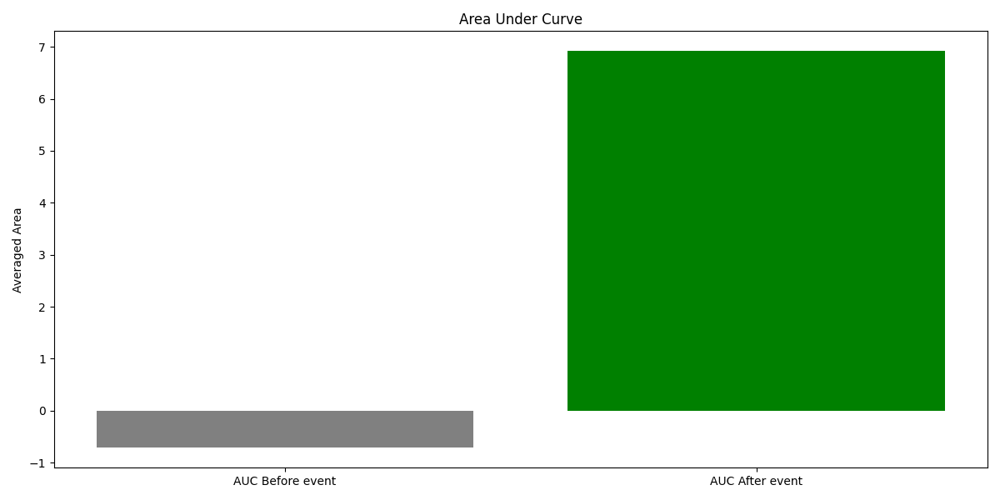

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs/AUC_Bars_Success.png


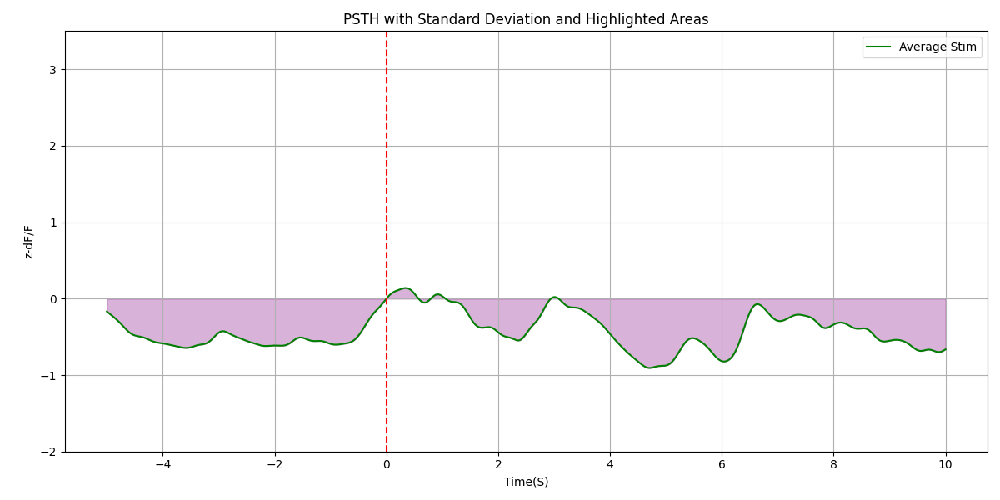

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs/AUC_Fail.png


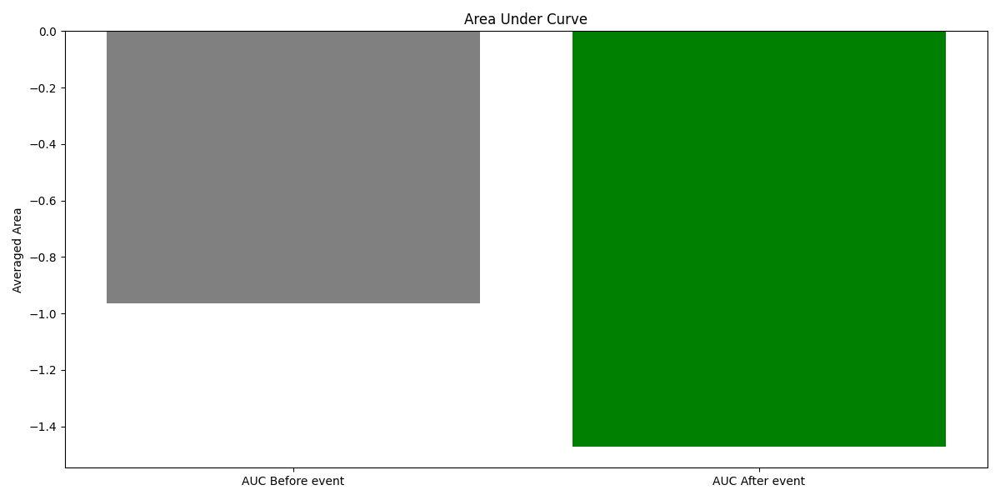

Figure saved as /home/coder/project/doric_fiberphotometry/Data/knob/258_NAc_knob_Apr25_0000_153852396_incomplete/Figs/AUC_Bars_Fail.png


In [66]:
import photometry_functions as pf
import fileselector as fs
import os
from importlib import reload
reload(fs)
reload(pf)
fs.load_dependencies()

# Success
plt.figure(figsize=(12, 6))

pf.plot_psth_auc(PSTH_df_std_Success,-2, 3.5,'green','Stim')
plt.show()
filename = file_selector.file_path.split('.')[0]+'/Figs/'+'AUC_Success.png'

directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)
plt.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")

pf.plot_auc_bars_with_duration(PSTH_df_std_Success,-1.5, 1.5,(-2,0),(0,5))
filename = file_selector.file_path.split('.')[0]+'/Figs/'+'AUC_Bars_Success.png'

directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)
plt.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")

# Fail
plt.figure(figsize=(12, 6))

pf.plot_psth_auc(PSTH_df_std_Fail,-2, 3.5,'green','Stim')
plt.show()
filename = file_selector.file_path.split('.')[0]+'/Figs/'+'AUC_Fail.png'

directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)
plt.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")

pf.plot_auc_bars_with_duration(PSTH_df_std_Fail,-1.5, 1.5,(-2,0),(0,5))
filename = file_selector.file_path.split('.')[0]+'/Figs/'+'AUC_Bars_Fail.png'

directory = os.path.dirname(filename)
if not os.path.exists(directory):
    os.makedirs(directory)
plt.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {filename}")



# saving all the Dataframes as CSV

In [ ]:
import pandas as pd
import datetime

def save_dataframes_to_csv():
    # Fetch the current datetime to append to file names to avoid overwriting
    now = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = file_selector.file_path.split('.')[0]+'/Data/'+'test.csv"'
    directory = os.path.dirname(filename)
    if not os.path.exists(directory):
        os.makedirs(directory)
    # Loop through all global variables
    for var_name, value in list(globals().items()):
        # Check if the value is an instance of pd.DataFrame
        if isinstance(value, pd.DataFrame):
            # Construct filename with a timestamp to prevent overwriting
            file = f"{var_name}_{now}.csv"
            filename = file_selector.file_path.split('.')[0]+'/Data/'+file

            # Save the DataFrame to a CSV file
            value.to_csv(filename, index=False)
            print(f"Saved {filename}")


# Call the function to save all DataFrames
save_dataframes_to_csv()


# reloading saved data

In [ ]:
import pandas as pd

def load_dataframe_from_csv(file_path):
    """
    Loads a DataFrame from a CSV file.

    Parameters:
    file_path (str): The path to the CSV file to be loaded.

    Returns:
    pandas.DataFrame: The DataFrame containing the data from the CSV file.
    """
    # Loading the DataFrame from the specified CSV file
    df = pd.read_csv(file_path)
    
    return df

# Example usage:
# Replace 'your_file.csv' with the path to the CSV file you want to load

csv_file_path = 'your_file.csv'
df = load_dataframe_from_csv(csv_file_path)
# Optionally, you can display the first few rows of the loaded DataFrame


In [ ]:
centralized_signals_df_Init


In [ ]:
import pandas as pd
import datetime
# Assuming centralized_signals_df_Init is your DataFrame

# If 'Event' is part of a MultiIndex, reset the index
if isinstance(centralized_signals_df_Init.index, pd.MultiIndex):
    centralized_signals_df_Init.reset_index(inplace=True)

# Filter the DataFrame for the base data at Time 0
# base_df = centralized_signals_df_Init[centralized_signals_df_Init['Time'] == 0]
# Filter the dataframe for the time range first
base_df = centralized_signals_df_Init[(centralized_signals_df_Init['Time'] >= -4) & (centralized_signals_df_Init['Time'] <= -2)]



base_df = base_df.groupby('Event')['Data'].mean().reset_index()
base_df.rename(columns={'Data': 'F_Init'}, inplace=True)

# Filter the DataFrame for Time values between 0 and 2
filtered_df = centralized_signals_df_Init[(centralized_signals_df_Init['Time'] >= 0) & (centralized_signals_df_Init['Time'] <= 2)]

# Group by 'Event' and find the maximum 'Data' value in each group
max_df = filtered_df.groupby('Event')['Data'].max().reset_index()
max_df.rename(columns={'Data': 'F_Max'}, inplace=True)

# Merge the base data and MaxdFF
result_df = pd.merge(base_df, max_df, on='Event', how='left')

# Calculate the difference between 'Max Data' and 'Base'
result_df['dFF'] = result_df['F_Max'] - result_df['F_Init']

# Calculate Init_Speed and Av_Speed
# Define time intervals for Init_Speed and Av_Speed calculations
init_interval_df = centralized_signals_df_Init[(centralized_signals_df_Init['Time'] >= 0) & (centralized_signals_df_Init['Time'] <= 0.1)]
av_interval_df = filtered_df  # already filtered from 0 to 2

# Group by 'Event' and calculate min and max 'Data' for Init_Speed
init_speed_calc = init_interval_df.groupby('Event')['Data'].agg(['min', 'max'])
init_speed_calc['F_Init_Speed'] = (init_speed_calc['max'] - init_speed_calc['min']) / 0.1

# Group by 'Event' and calculate min and max 'Data' for Av_Speed
av_speed_calc = av_interval_df.groupby('Event')['Data'].agg(['min', 'max'])
av_speed_calc['F_Av_Speed'] = (av_speed_calc['max'] - av_speed_calc['min']) / 2

# Merge these calculations into the result_df
result_df = result_df.merge(init_speed_calc[['F_Init_Speed']], on='Event', how='left')
result_df = result_df.merge(av_speed_calc[['F_Av_Speed']], on='Event', how='left')

# Save to CSV
now = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
file = f"result_data_{now}.csv"
result_df.to_csv(file, index=False)
result_df.to_csv('result_data.csv', index=False)

# Print confirmation
print(f"The result has been saved to '{file}'.")


In [ ]:
import pandas as pd

# Simulating the creation of your initial DataFrame
data = {
    "Event": [1, 1, 1, 1, 1],
    "Row": [617, 618, 619, 620, 621],
    "Time": [-4.00, -3.99, -3.98, -3.97, -3.96],
    "Data": [0.330067, 0.341075, 0.356469, 0.363225, 0.341833]
}
centralized_signals_df_Init = pd.DataFrame(data)

# Define the time intervals
init_interval = (0, 0.1)
av_interval = (0, 2)

# Filter the DataFrame for the initial interval and calculate Init_Speed
init_data = centralized_signals_df_Init[(centralized_signals_df_Init['Time'] >= init_interval[0]) & (centralized_signals_df_Init['Time'] <= init_interval[1])]
if not init_data.empty:
    init_speed = (init_data['Data'].max() - init_data['Data'].min()) / (init_data['Time'].max() - init_data['Time'].min())
else:
    init_speed = 0

# Filter the DataFrame for the average interval and calculate Av_Speed
av_data = centralized_signals_df_Init[(centralized_signals_df_Init['Time'] >= av_interval[0]) & (centralized_signals_df_Init['Time'] <= av_interval[1])]
if not av_data.empty:
    av_speed = (av_data['Data'].max() - av_data['Data'].min()) / (av_data['Time'].max() - av_data['Time'].min())
else:
    av_speed = 0

# Assuming result_df exists and we can add columns to it
result_df['Init_Speed'] = init_speed
result_df['Av_Speed'] = av_speed

print(result_df)


In [ ]:
import pandas as pd

# Assuming centralized_signals_df_Init is your DataFrame

# Reset index if 'Event' is part of a MultiIndex
if isinstance(centralized_signals_df_Init.index, pd.MultiIndex):
    centralized_signals_df_Init.reset_index(inplace=True)

# Define function to calculate speed
def calculate_speed(df, start_time, end_time):
    # Filter data within the specified time range
    time_filtered = df[(df['Time'] >= start_time) & (df['Time'] <= end_time)]
    if time_filtered.empty:
        return float('nan')  # Return NaN if no data in the specified range
    else:
        # Calculate max and min data values
        max_value = time_filtered['Data'].max()
        min_value = time_filtered['Data'].min()
        # Calculate dt
        dt = end_time - start_time
        # Calculate speed
        return (max_value - min_value) / dt

result_df['Init_Speed'] = calculate_speed(centralized_signals_df_Init, 0, 0.1)
result_df['Av_Speed'] = calculate_speed(centralized_signals_df_Init, 0, 2)

# Save to CSV
result_df.to_csv('result_data_with_speeds.csv', index=False)

# Print confirmation
print("The result, including 'Init_Speed' and 'Av_Speed', has been saved to 'result_data_with_speeds.csv'.")
